This notebook explains the pipeline for long axis

In [1]:
from utils import *

# Download your dicom files and convert to nifti

In [ ]:
convert_zip_to_nifti(patients_csv = "/workspace/Milos/TestNifti/patients.csv",  
                         data_root = "/workspace/Milos/TestNifti/",
                         output_dir = "/workspace/Milos/UKBB_nifti",
                         start=0,
                         end=10000):

In [18]:
image_path= "demo_image/1/la_4ch.nii.gz"
nim = nib.load(image_path)
image = nim.get_fdata()
seg_image = np.zeros_like(image)
create_video(image,seg_image,cut=0)

/opt/conda/lib/python3.8/site-packages/matplotlib/image.py:446: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/opt/conda/lib/python3.8/site-packages/matplotlib/image.py:480: UserWarning: Warning: converting a masked element to nan.
  vrange = np.array([vmin, vmax], dtype=scaled_dtype)


# Segment Nifti files

specify absolute path of your dir

In [3]:
%cd ukbb_cardiac
!bash -i segment.rc /workspace/Milos/UKB/demo_image
%cd ..

/workspace/Milos/UKB/ukbb_cardiac
Activating environment
# conda environments:
#
                         /opt/conda
base                     /root/miniconda3
echonet                  /root/miniconda3/envs/echonet
ukb_cardiac              /root/miniconda3/envs/ukb_cardiac
ukb_milos                /root/miniconda3/envs/ukb_milos
ukb_seg               *  /root/miniconda3/envs/ukb_seg
                         /workspace/Milos/UKBB-CMR/ukbb_cardiac/env

Instructions for updating:
non-resource variables are not supported in the long term
2021-07-19 13:34:56.448895: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2021-07-19 13:34:56.455757: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 3800020000 Hz
2021-07-19 13:34:56.458679: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x5642bf8cd8e0 initialized for platform Host (this does not guarantee that XLA wil

In [4]:
%ls

DatasetBMI.ipynb          MitralValve.ipynb      data@            ukb45494.csv
ExamplePipeline.ipynb     PapillaryMuscle.ipynb  demo_image/      ukbb_cardiac/
LA_traits.csv             Traits.ipynb           environment.yml  utils.py
LeftVentricleShape.ipynb  WallThickness.ipynb    extract.py
MeanPapillaryMass.csv     __pycache__/           iterate.py


In [6]:
image_path= "demo_image/1/la_4ch.nii.gz"
seg_image_path= "demo_image/1/seg4_la_4ch.nii.gz"
nim = nib.load(image_path)
image = nim.get_fdata()
seg_nim = nib.load(seg_image_path)
seg_image = seg_nim.get_fdata()

In [7]:
create_video(image,seg_image,cut=0)

# Extract traits

Here we are going to extract traits and prepare a document for GWAS

## Left Ventricle Shape

In [8]:
orig_image, masked_image,shape_properties = segment_left_ventricle(image_path,seg_image_path)
create_video_lv(orig_image,masked_image,shape_properties,cut=0)

In [9]:
figs,dists = segment_mitral_valve(image_path,seg_image_path)
create_video_mitral_valve(figs,dists)

In [ ]:
#!bash python iterate.py

In [21]:
import pandas as pd
df = pd.read_csv("LA_traits.csv")
df

,id,mitral_valve_distance_mean,mitral_valve_distance_ED,mitral_valve_distance_ES,left_ventricle_height_mean,left_ventricle_height_ED,left_ventricle_height_ES,left_ventricle_width_mean,left_ventricle_width_ED,left_ventricle_width_ES,...,10.512482734487513,48.55213901031024,54.38632351089771,42.94249055843762,26.485260058775435,30.167447539954455,22.11788454456859,-22.93345205467868,-20.295218961784638,-27.10843373493976
0,1000158,14.585599,18.717840,9.878047e+00,37.622694,45.076566,21.425468,17.700609,22.559405,11.342896,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000243,11.705458,15.395778,6.402310e+00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1000262,5.760992,10.174257,1.943095e-01,39.574230,45.795016,29.654733,23.620716,28.551404,19.034660,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1000369,8.571434,48.478257,8.284961e-02,48.232380,52.346370,44.202334,27.807905,31.621891,23.732224,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1000489,10.093875,17.456578,1.291830e+00,46.820928,52.507317,41.227126,24.613501,29.122172,20.096731,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36262,6024290,11.779436,15.569828,8.694877e+00,48.138843,52.766186,40.231015,24.770485,27.659696,20.851153,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36263,6024323,3.720606,11.766201,2.213662e-01,32.465728,43.521535,22.021155,18.872417,23.705701,13.816361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36264,6024624,13.014242,17.013090,6.566455e+00,48.994987,54.222933,40.490206,23.729676,27.854550,17.887525,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36265,6024638,5.374556,49.286627,1.854362e-01,37.870789,39.681264,34.952932,25.801510,29.218729,20.851423,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
with open("mitral_distance.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['mitral_valve_distance_mean'][i]}\n")

with open("height.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['left_ventricle_height_mean'][i]}\n")

with open("width.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['left_ventricle_width_mean'][i]}\n")

with open("angle.phe",'w') as f:
    for i in df.index:
        f.write(f"{df['id'][i]} {df['id'][i]}  {df['left_ventricle_angle_mean'][i]}\n")

# GWAS

Steps:

Step 1: Download the data (*.bed, *.fam, *.bim)

    *.bed - individual identifiers and genotypes ( ./gfetch 22418 -c5 )

    *.fam info on the individuals ( ./gfetch 22418 -c5 -m)

    *.bim genetics markers (downloaded using wget)

Step 2: Perform Quality check 7 steps
        * Missingness of SNPs and individuals
        * Sex discrepancy
        * Minor allele frequency 
        * Hardy–Weinberg equilibrium 
        * Heterozygosity
        * Relatedness

Step 3: Stratification ( for example if we have two populations let's say Serbia and US and we put it in the same box, we cannot claim correlation between SNIp and a trait because ethnicity might be underlying factor)

Step 4: Perform GWAS and generate plots

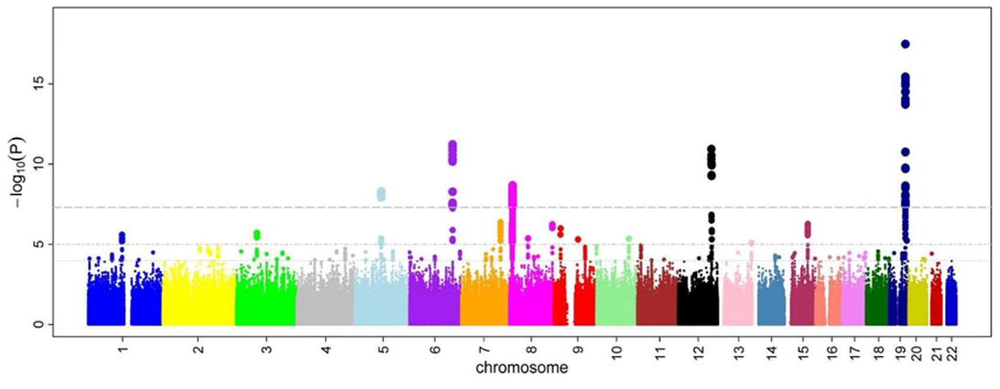

In [17]:
import IPython
url = 'https://upload.wikimedia.org/wikipedia/commons/1/12/Manhattan_Plot.png'
IPython.display.Image(url, width = 1000)

We take the whole area around detected SNP because of the linkage disequilibrium